# Libraries and Dataset

In [1]:
# Data Manipulation and Visualization 
import pandas as pd, numpy as np, matplotlib.pyplot as plt, seaborn as sns, plotly_express as px

# Data Preprocessing 
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

# Metrics to evaluate the models 
from sklearn.metrics import accuracy_score, precision_score, confusion_matrix, recall_score, f1_score

# Classifiers 
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier

# Setting theme style and color palette to seaborn 
sns.set_theme(context = 'notebook', style='darkgrid', palette='muted')

In [2]:
# Dataset - It has 284,807 transactions and 30 variables.

df = pd.read_csv(r'creditcard.csv')
df.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0


In [3]:
df.Amount.describe().round(2)

count    284807.00
mean         88.35
std         250.12
min           0.00
25%           5.60
50%          22.00
75%          77.16
max       25691.16
Name: Amount, dtype: float64

In [21]:
# Functions 

def confusion_m(test_y,y_predictions_rf,y_predictions_dt,y_predictions_ab,y_prediction_gb):
    
    
    confusion_matrix_rf = confusion_matrix(test_y, y_predictions_rf)
    confusion_matrix_df = confusion_matrix(test_y, y_predictions_dt)
    confusion_matrix_ab = confusion_matrix(test_y, y_predictions_ab)
    confusion_matrix_gb = confusion_matrix(test_y, y_prediction_gb)
    
    # Create a 2x2 grid of subplots for the confusion matrices
    fig, axes = plt.subplots(2, 2, figsize=(12, 10))

    # Plot the confusion matrix for Random Forest in the top-left subplot
    sns.heatmap(confusion_matrix_rf, annot=True, fmt='g', ax=axes[0, 0])
    axes[0, 0].set_xlabel('Predicted Values')
    axes[0, 0].set_ylabel('Actual Values')
    axes[0, 0].set_title('Confusion Matrix - Random Forest')
    axes[0, 0].xaxis.set_ticklabels(['Genuine', 'Fraud'])
    axes[0, 0].yaxis.set_ticklabels(['Genuine', 'Fraud'])

    # Plot the confusion matrix for SVM in the top-right subplot
    sns.heatmap(confusion_matrix_df, annot=True, fmt='g', ax=axes[0, 1])
    axes[0, 1].set_xlabel('Predicted Values')
    axes[0, 1].set_ylabel('Actual Values')
    axes[0, 1].set_title('Confusion Matrix - Decision Tree')
    axes[0, 1].xaxis.set_ticklabels(['Genuine', 'Fraud'])
    axes[0, 1].yaxis.set_ticklabels(['Genuine', 'Fraud'])

    # Plot the confusion matrix for KNN in the bottom-left subplot
    sns.heatmap(confusion_matrix_ab, annot=True, fmt='g', ax=axes[1, 0])
    axes[1, 0].set_xlabel('Predicted Values')
    axes[1, 0].set_ylabel('Actual Values')
    axes[1, 0].set_title('Confusion Matrix - Ada Boost')
    axes[1, 0].xaxis.set_ticklabels(['Genuine', 'Fraud'])
    axes[1, 0].yaxis.set_ticklabels(['Genuine', 'Fraud'])

    # Plot the confusion matrix for Decision Tree in the bottom-right subplot
    sns.heatmap(confusion_matrix_gb, annot=True, fmt='g', ax=axes[1, 1])
    axes[1, 1].set_xlabel('Predicted Values')
    axes[1, 1].set_ylabel('Actual Values')
    axes[1, 1].set_title('Confusion Matrix - Gradient Boosting')
    axes[1, 1].xaxis.set_ticklabels(['Genuine', 'Fraud'])
    axes[1, 1].yaxis.set_ticklabels(['Genuine', 'Fraud'])

    # Adjust the layout to prevent overlap
    plt.tight_layout()

    # Show the plot
    plt.show()

# Analysis

In [4]:
# Distribution of Amount
fig = px.scatter(df, x = 'Amount', y =df.index, color = df.Class,
                title = 'Distribution of Amount Values')
fig.update_layout(xaxis_title='Transaction Amount (in €)',
                    yaxis_title='Transactions')
fig.show()

In [5]:
# Class distribution

df.Class.value_counts()

Class
0    284315
1       492
Name: count, dtype: int64

In [6]:
# Visualizing Class distribution
fig = px.pie(values=df['Class'].value_counts().values,
             names=['Genuine', 'Fraud'], title='Fraudulent x Genuine Transactions in the Dataset')
fig.show()

We have a huge class imbalance to work on here. Only 0.17% of the transactions were Fraudulent!

In [7]:
# More infor about the fraudulent transaction 

df.query("Class == 1").Amount.describe()

count     492.000000
mean      122.211321
std       256.683288
min         0.000000
25%         1.000000
50%         9.250000
75%       105.890000
max      2125.870000
Name: Amount, dtype: float64

In [8]:
# Distribution of fraudulent transactions amount
fig = px.scatter(df.query("Class==1"), x = 'Amount', y =df.query("Class==1").index,
                title = 'Distribution of Fraudulent Amounts')
fig.update_layout(xaxis_title='Transaction Amount (in €)',
                    yaxis_title='Transactions')
fig.show()

# Data Preprocessing 

In [9]:
df.drop(columns=['Time'], axis=1,inplace=True)

In [10]:
# Divide the data into X and Y for training

x = df.iloc[:,:-1]
y = df.Class

In [11]:
# Scaling Amount Column 

scaler = StandardScaler()
x['Amount'] = scaler.fit_transform(x.Amount.values.reshape(-1,1))
x

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount
0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,0.090794,...,0.251412,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,0.244964
1,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,-0.166974,...,-0.069083,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,-0.342475
2,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,0.207643,...,0.524980,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,1.160686
3,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,-0.054952,...,-0.208038,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,0.140534
4,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,0.753074,...,0.408542,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,-0.073403
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
284802,-11.881118,10.071785,-9.834783,-2.066656,-5.364473,-2.606837,-4.918215,7.305334,1.914428,4.356170,...,1.475829,0.213454,0.111864,1.014480,-0.509348,1.436807,0.250034,0.943651,0.823731,-0.350151
284803,-0.732789,-0.055080,2.035030,-0.738589,0.868229,1.058415,0.024330,0.294869,0.584800,-0.975926,...,0.059616,0.214205,0.924384,0.012463,-1.016226,-0.606624,-0.395255,0.068472,-0.053527,-0.254117
284804,1.919565,-0.301254,-3.249640,-0.557828,2.630515,3.031260,-0.296827,0.708417,0.432454,-0.484782,...,0.001396,0.232045,0.578229,-0.037501,0.640134,0.265745,-0.087371,0.004455,-0.026561,-0.081839
284805,-0.240440,0.530483,0.702510,0.689799,-0.377961,0.623708,-0.686180,0.679145,0.392087,-0.399126,...,0.127434,0.265245,0.800049,-0.163298,0.123205,-0.569159,0.546668,0.108821,0.104533,-0.313249


In [12]:
train_x, test_x, train_y, test_y = train_test_split(x,y, test_size=0.3,random_state=123)
print('X Train size: ',train_x.shape)
print('X Test size: ', test_x.shape)

print('Y Train size: ', train_y.shape)
print('Y Test size: ', test_y.shape)

X Train size:  (199364, 29)
X Test size:  (85443, 29)
Y Train size:  (199364,)
Y Test size:  (85443,)


In [13]:
y.value_counts() # 0 = Genuine Transactions | 1 = Fraud

Class
0    284315
1       492
Name: count, dtype: int64

In [14]:
# Apply SMOTE on the traning set in order to get more Fraud samples 

from imblearn.over_sampling import SMOTE

train_x, train_y = SMOTE().fit_resample(train_x,train_y)  # Reshaping data

In [15]:
train_y.value_counts() #0 = Genuine Transactions | 1 = Fraud

Class
0    199032
1    199032
Name: count, dtype: int64

# Classifiers

In [16]:
#Training all classifiers 


#Random Forest Classifier 
random_forest = RandomForestClassifier(n_estimators = 100, random_state = 123)
random_forest.fit(train_x,train_y)
 
y_predictions_rf = random_forest.predict(test_x)
 
#Decision Tree Classifier 
decision_tree = DecisionTreeClassifier(random_state = 123)
decision_tree.fit(train_x,train_y)
 
y_predictions_dt = decision_tree.predict(test_x)
 
#Ada Boost Classifier 
ada_boost = AdaBoostClassifier(n_estimators = 100, random_state = 123)
ada_boost.fit(train_x,train_y)
 
y_predictions_ab = ada_boost.predict(test_x)
 
#Gradient Boosting Classifier 
gradient_boosting = GradientBoostingClassifier(n_estimators = 100, random_state = 123)
gradient_boosting.fit(train_x,train_y)
 
y_prediction_gb = gradient_boosting.predict(test_x)

In [28]:
# Printing Evaluation Metrics for all classifiers 


metrics_rf = [['Random Forest', 
               accuracy_score(test_y, y_predictions_rf),
               precision_score(test_y, y_predictions_rf),
               recall_score(test_y, y_predictions_rf),
               f1_score(test_y, y_predictions_rf)]]


metrics_dt = [['Decision Tree', 
               accuracy_score(test_y, y_predictions_dt),
               precision_score(test_y, y_predictions_dt),
               recall_score(test_y, y_predictions_dt),
               f1_score(test_y, y_predictions_dt)]]


metrics_ad = [['Ada Boost', 
               accuracy_score(test_y, y_predictions_ab),
               precision_score(test_y, y_predictions_ab),
               recall_score(test_y, y_predictions_ab),
               f1_score(test_y, y_predictions_ab)]]


metrics_gb = [['Gradient Boosting', 
               accuracy_score(test_y, y_prediction_gb),
               precision_score(test_y, y_prediction_gb),
               recall_score(test_y, y_prediction_gb),
               f1_score(test_y, y_prediction_gb)]]


In [31]:
columns = ['Classifier', 'Accuracy', 'Precision', 'Recall', 'F1 Score']

df_rf = pd.DataFrame(metrics_rf, columns=columns)
df_dt = pd.DataFrame(metrics_dt, columns=columns)
df_ad = pd.DataFrame(metrics_ad, columns=columns)
df_gb = pd.DataFrame(metrics_gb, columns=columns)

In [33]:
combined_metrics = pd.concat([df_rf, df_dt, df_ad, df_gb], ignore_index=True)

print(combined_metrics)

          Classifier  Accuracy  Precision   Recall  F1 Score
0      Random Forest  0.999403   0.851613  0.82500  0.838095
1      Decision Tree  0.997788   0.449827  0.81250  0.579065
2          Ada Boost  0.986412   0.111715  0.90000  0.198758
3  Gradient Boosting  0.988039   0.125868  0.90625  0.221037


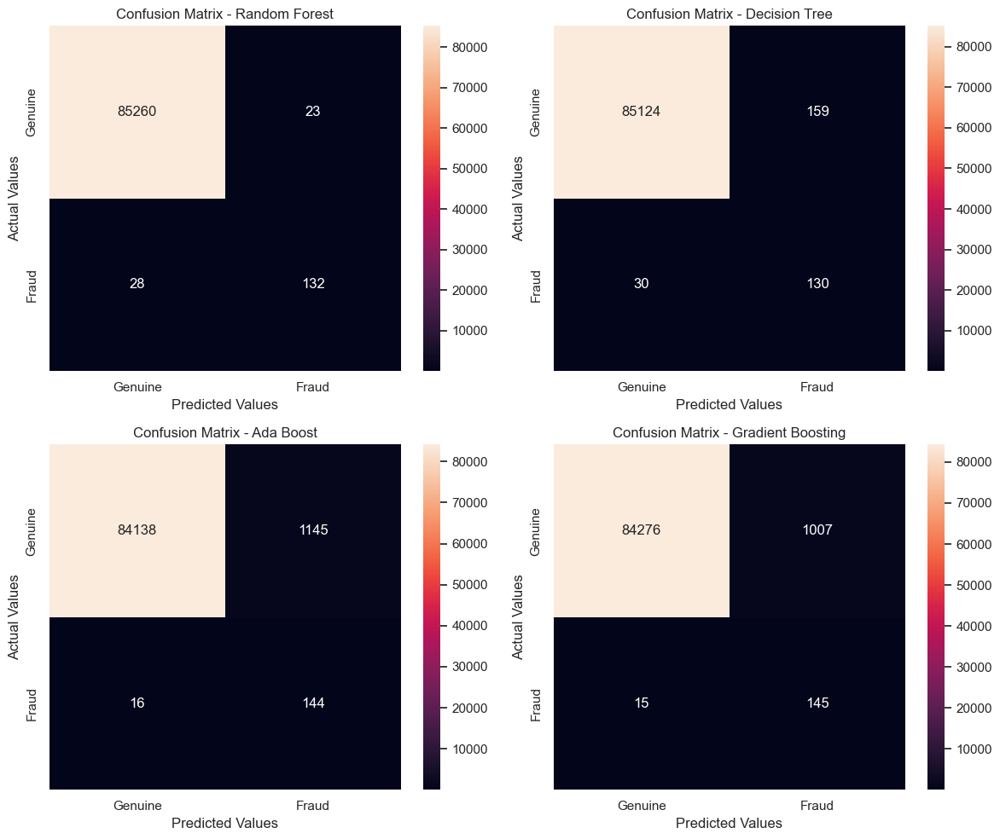

In [22]:
# plot 4 confusion matrix for the classifiers

confusion_m(test_y,y_predictions_rf,y_predictions_dt,y_predictions_ab,y_prediction_gb)

In [34]:
# Real values in the test set to compare 

test_y.value_counts()

Class
0    85283
1      160
Name: count, dtype: int64